Look into propagated uncertainty on the Pancreas 
---
Investigates uncertainty propagation using the example of single cells. Compares three approaches:
- deterministic
- analytical (second order Taylor into the trans. probs, then deterministic)
- sampling based (Monte Carlo, all the way into abs. probs)

# Preliminaries

## Import packages

In [1]:
%load_ext autoreload
%autoreload 2

import scvelo as scv
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
from seaborn import distplot, heatmap, barplot
import pandas as pd 
from scipy.stats import entropy

import cellrank as cr
cr.settings.verbosity = 2
scv.settings.verbosity = 3 

In [2]:
# print relevant package versions
scv.logging.print_version()
print(f'cellrank version = {cr.__version__}')
sc.logging.print_header()

Running scvelo 0.2.2 (python 3.8.5) on 2020-10-02 11:25.
cellrank version = 1.0.0-rc.12
scanpy==1.6.0 anndata==0.7.4 umap==0.4.6 numpy==1.19.1 scipy==1.5.2 pandas==1.1.1 scikit-learn==0.23.2 statsmodels==0.11.1 python-igraph==0.8.2 louvain==0.6.1 leidenalg==0.8.1


In [3]:
# set up paths
import sys
import os
sys.path.insert(0, '../')
from paths import get_paths
file_paths = get_paths()

# set up cache
import scachepy 
c = scachepy.Cache(os.path.join(file_paths['cache_dir'], '19062020_ml_fig_2_pancreas'),  separate_dirs=True)
c

Cache(root=/Users/marius/Projects/cellrank_notebooks_dev/notebooks/cache/19062020_ml_fig_2_pancreas, ext='.pickle', compression='None')

In [4]:
# figure settings
scv.settings.set_figure_params('scvelo', dpi_save=400, dpi=80, transparent=True, fontsize=16)
scv.settings.plot_prefix = 'cellrank_uncertainty'

save_figure = True
figdir = f'{file_paths["fig_dir"]}/uncertainty/'
scv.settings.figdir = figdir
sc.settings.figdir = figdir

## Load the data

Load the adata object with all time points:

In [5]:
adata = scv.read(os.path.join(file_paths['pancreas'], '180620_ml_endocrinogenesis_E15.5.h5ad'))

# create raw object
adata_raw = adata.copy()
sc.pp.filter_genes(adata_raw, min_cells=3)
sc.pp.normalize_total(adata_raw)
sc.pp.log1p(adata_raw)
adata.raw = adata_raw

adata

filtered out 13059 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)


AnnData object with n_obs × n_vars = 2531 × 27998
    obs: 'day', 'proliferation', 'G2M_score', 'S_score', 'phase', 'clusters_coarse', 'clusters', 'clusters_fine', 'louvain_Alpha', 'louvain_Beta'
    var: 'highly_variable_genes'
    uns: 'clusters_colors', 'clusters_fine_colors', 'day_colors', 'louvain_Alpha_colors', 'louvain_Beta_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

## Compute Velocities

In [6]:
# filter, normalise, log transform
scv.pp.filter_and_normalize(adata, min_shared_counts=20, log=True, n_top_genes=2000)

# compute pca, knn graph and scvelo's moments
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

# compute/load from cache the dyn. model params and compute velocities
c.tl.recover_dynamics(adata, fname='recover_dynamics', force=False)
scv.tl.velocity(adata, mode='dynamical')

Filtered out 22024 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Exctracted 2000 highly variable genes.
Logarithmized X.
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:01)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Loading data from: `recover_dynamics.pickle`.
computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


## Project Velocities onto the Embedding

- compute the velocity graph
- plot velocities in the time-point embedding

Compute the velocity graph

In [7]:
scv.tl.velocity_graph(adata)

computing velocity graph
    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file /Users/marius/Projects/cellrank_notebooks_dev/figures//uncertainty/cellrank_uncertaintyvelocities.png


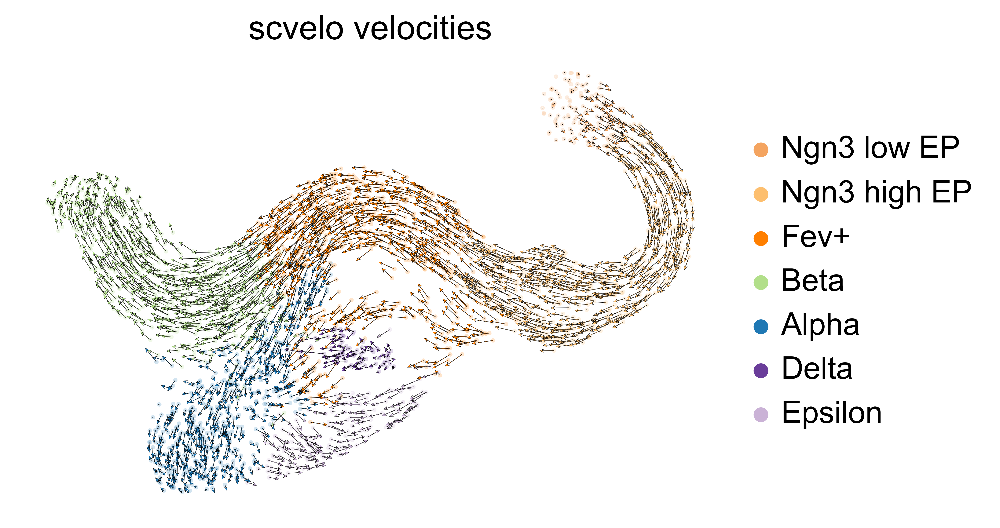

In [8]:
figure_params = {'color': ['clusters'], 'title': f'scvelo velocities',
                 'legend_loc': 'right', 'dpi': 400, 'scale': 0.1,}

if save_figure: figure_params['save'] = f'velocities.png'
scv.pl.velocity_embedding(adata, **figure_params)

## Set global parameters

In [9]:
# set transition matrix parameters
softmax_scale = None
weight_connectivities = 0.2
seed = 0
n_samples = 50000

# set estimator parameters
n_states = 9

# Look into uncertainties

## Compute transition probabilities

Compute transition probabilities in three different ways:
- deterministic approach
- sampling, Monte Carlo
- analytical, JAX

In [10]:
from cellrank.tl.kernels import PrecomputedKernel

The below is a workaround. Current problem is that when caching the transition matrix computation, this does not return a kernel object. 

In [11]:
# deterministic kernel
c.tl.transition_matrix(adata, softmax_scale=softmax_scale, weight_connectivities=weight_connectivities, 
                       mode="deterministic", fname='trans_mat_det')
ker_det = PrecomputedKernel(adata.obsp['T_fwd'], adata)

# mc kernel
c.tl.transition_matrix(adata, softmax_scale=softmax_scale, weight_connectivities=weight_connectivities, 
                       mode="monte_carlo", n_samples=n_samples, seed=seed, n_jobs=8, fname='trans_mat_mc')
ker_mc = PrecomputedKernel(adata.obsp['T_fwd'], adata)

# jax kernel
c.tl.transition_matrix(adata, softmax_scale=softmax_scale, weight_connectivities=weight_connectivities, 
                       mode="stochastic", n_jobs=8, fname='trans_mat_jax')
ker_jax = PrecomputedKernel(adata.obsp['T_fwd'], adata)

Loading data from: `trans_mat_det.pickle`.
Loading data from: `trans_mat_mc.pickle`.
`adata.obsp` already contains key: `'T_fwd'`.
`adata.uns` already contains key: `'T_fwd_params'`.
Loading data from: `trans_mat_jax.pickle`.
`adata.obsp` already contains key: `'T_fwd'`.
`adata.uns` already contains key: `'T_fwd_params'`.


In [12]:
# ker_det = cr.tl.transition_matrix(adata, softmax_scale=softmax_scale, weight_connectivities=weight_connectivities, 
#                        mode="deterministic")
# ker_mc = cr.tl.transition_matrix(adata, softmax_scale=softmax_scale, weight_connectivities=weight_connectivities, 
#                        mode="monte_carlo", n_samples=n_samples, seed=seed, n_jobs=8)
# ker_jax = cr.tl.transition_matrix(adata, softmax_scale=softmax_scale, weight_connectivities=weight_connectivities, 
#                        mode="stochastic", n_jobs=8)

We need two cells: one from a high noise region and one from a low noise region. For that, let's compute the median variance per cell.  

## Select representative cells

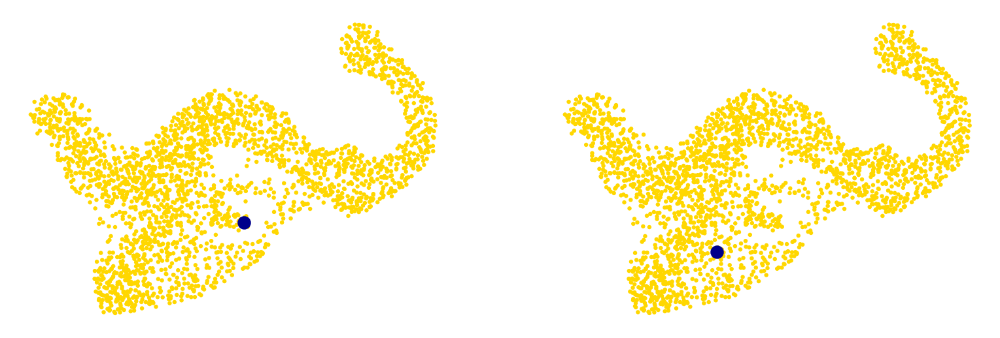

In [13]:
from scvelo.preprocessing.moments import get_moments

gene_subset = adata.var['velocity_genes']
X = adata.layers['Ms'][:, gene_subset]
V = adata.layers['velocity'][:, gene_subset]

nans = np.isnan(np.sum(V, axis=0))
if np.any(nans):
    print("Warning: Filtering Nan values")
    X = X[:, ~nans]
    V = V[:, ~nans]
    
V_expectations = get_moments(adata, V, second_order=False)
V_variances = get_moments(adata, V, second_order=True)
variance_measure = np.median(V_variances, axis=1)
# variance_measure = np.min(V_variances, axis=1)

p = np.argsort(variance_measure)
ix_low, ix_high = p[0], p[-1]

scv.pl.scatter(adata, color=[ix_low, ix_high])

In [14]:
variance_measure.max(), variance_measure.min()

(0.0015558671530417102, 2.8090003542962077e-05)

In [15]:
variance_measure[p[0]], variance_measure[p[-1]]

(2.8090003542962077e-05, 0.0015558671530417102)

Plot the lowest and highest noise cell

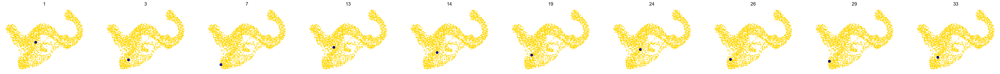

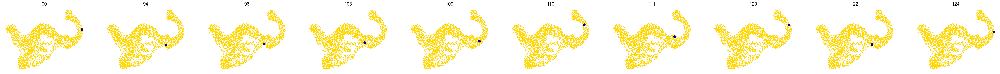

In [16]:
high_noise_ixs = np.where(adata.obs['clusters'] == 'Alpha')[0]
low_noise_ixs = np.where(adata.obs['clusters'] == 'Ngn3 high EP')[0]
scv.pl.scatter(adata, c=[ix for ix in high_noise_ixs[:10]], title = [str(ix) for ix in high_noise_ixs[:10]])
scv.pl.scatter(adata, c=[ix for ix in low_noise_ixs[20:30]], title = [str(ix) for ix in low_noise_ixs[20:30]])

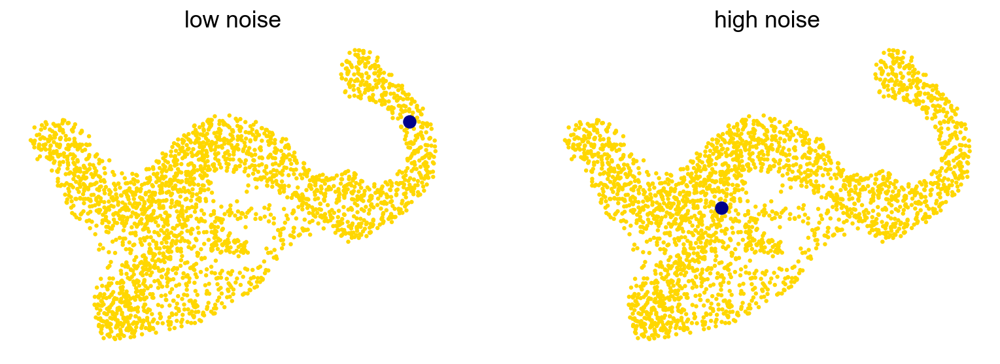

In [17]:
scv.pl.scatter(adata, color=[110, 1], title=['low noise', 'high noise'])

## Run plotting functions for one cell

### Show the cell and its nearest neighbors

Let's run one of these at a time. 

In [18]:
reference_ix = 110
nbhs_ixs = adata.obsp['connectivities'][reference_ix, :].indices
print(f"This is an {adata[reference_ix].obs['clusters'].values[0]} cell with {len(nbhs_ixs)} neighbors. ")

if reference_ix in nbhs_ixs:
    print("Warning, reference is in the neighbors")

This is an Ngn3 high EP cell with 35 neighbors. 


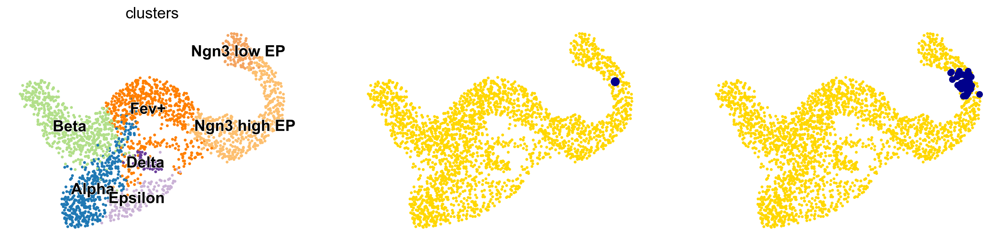

In [19]:
scv.pl.scatter(adata, color=['clusters', reference_ix, nbhs_ixs], legend_loc='on data')

Get W, the expected velo vector and its variance

In [20]:
W = X[nbhs_ixs, :] - X[reference_ix, :]

v_reference = V[reference_ix, :]
v_exp = V_expectations[reference_ix, :]
v_var = V_variances[reference_ix, :]

In [21]:
np.corrcoef(v_exp, v_reference)

array([[1.        , 0.95156142],
       [0.95156142, 1.        ]])

They are quite similar, they have large correlation. What's the distribution of the velocity variances?

<AxesSubplot:>

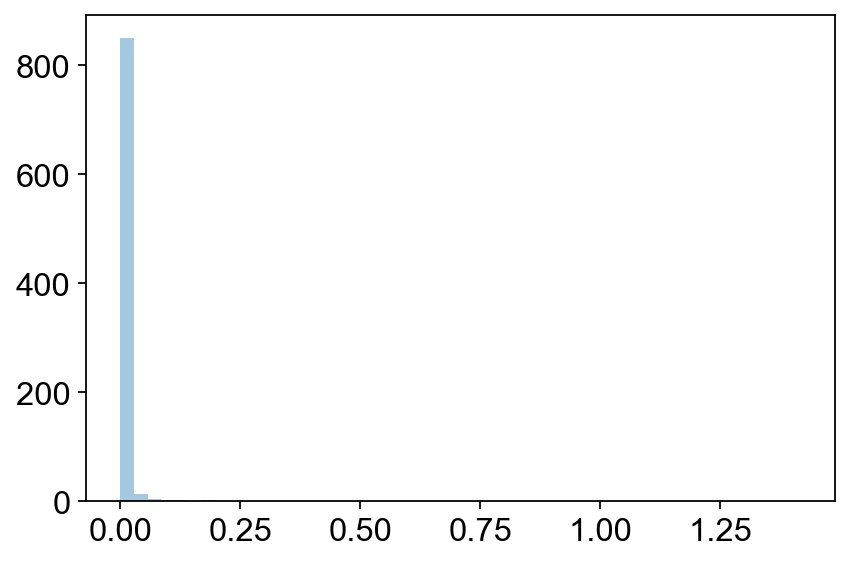

In [22]:
distplot(v_var, kde=False)

What's the range for the variances?

In [23]:
v_var.min(), v_var.max(), np.median(v_var)

(0.0, 1.4184912306845776, 0.00017983396983699848)

### Plot velocities

Plot the reference cell with it's neighbors and their velocity vectors

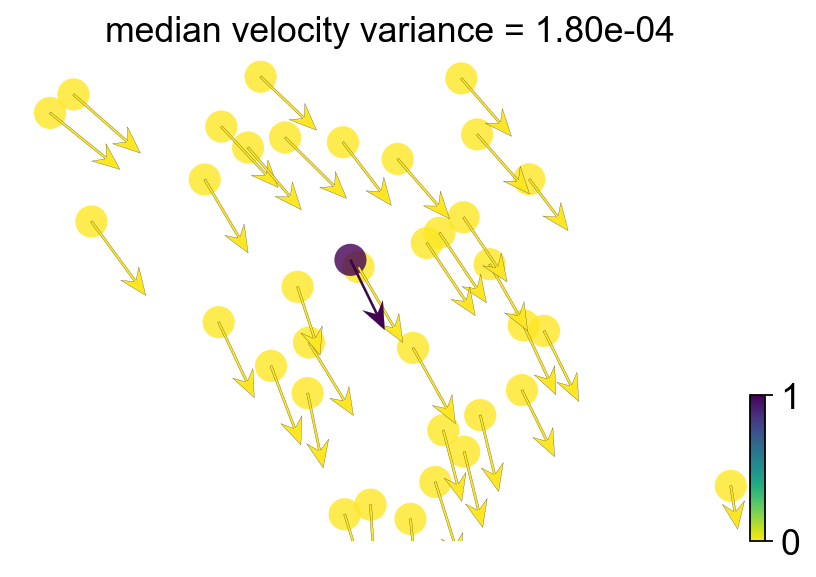

In [24]:
ext = lambda x, y: np.append(x, y)
reference_ix_mask = ext(nbhs_ixs, reference_ix) == reference_ix
scv.pl.velocity_embedding(adata[ext(nbhs_ixs, reference_ix)],
               color=[reference_ix_mask], 
               title=[f"median velocity variance = {np.median(v_var):.2e}"], alpha=0.8, scale=0.2, width=0.003, )

Plot this manually to have a bit more control. 

In [25]:
# crete a mask to identify the reference cell
reference_ix_mask = ext(nbhs_ixs, reference_ix) == reference_ix

# get the coordinates the vectors
umap = adata.obsm['X_umap'][ext(nbhs_ixs, reference_ix), :]
velocity = adata.obsm['velocity_umap'][ext(nbhs_ixs, reference_ix), :]

# create color annotations
color = scv.utils.interpret_colorkey(adata[ext(nbhs_ixs, reference_ix)], c="clusters")

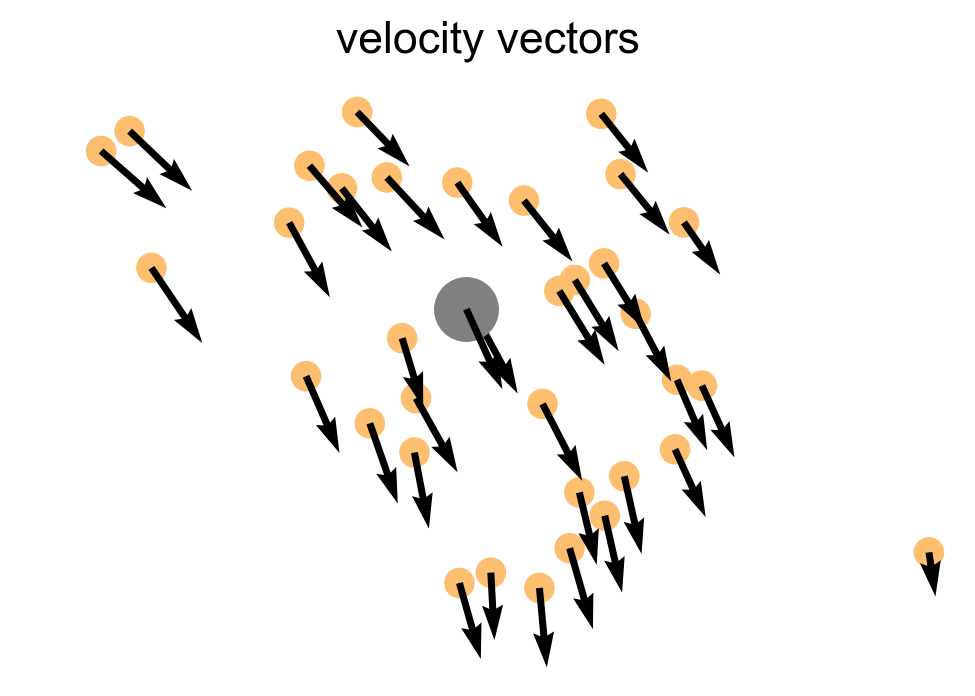

In [26]:
# create a figure 
fig = plt.figure(dpi=100)
ax = fig.add_subplot(111)

# plot all but the reference
ax.scatter(umap[~reference_ix_mask, 0], umap[~reference_ix_mask, 1], c=color[~reference_ix_mask], 
           cmap='viridis', s=100)
ax.quiver(umap[~reference_ix_mask, 0], umap[~reference_ix_mask, 1], 
          velocity[~reference_ix_mask, 0], velocity[~reference_ix_mask, 1], 
          color='k', linewidth = 0.5, scale=0.9)

# plot the reference cell
ax.scatter(umap[reference_ix_mask, 0], umap[reference_ix_mask, 1], c='grey', #c=color[reference_ix_mask], 
           cmap='viridis', s=500)
ax.quiver(umap[reference_ix_mask, 0], umap[reference_ix_mask, 1], 
          velocity[reference_ix_mask, 0], velocity[reference_ix_mask, 1], 
          color='k', linewidth = 0.5, scale=0.8)

# work on the axis
ax.set_title('velocity vectors')
ax.set_xlim(np.min(umap[:, 0]) -0.3, np.max(umap[:, 0]) + 0.1)
ax.set_ylim(np.min(umap[:, 1]) -0.4, np.max(umap[:, 1]) + 0.2)
plt.axis("off")

plt.show()

### Visualise transition probabilities

Get the transition probabilities for this cell by using the pre-computed kernel objects:

In [27]:
p_mc = ker_mc.transition_matrix[reference_ix].data
p_jax = ker_jax.transition_matrix[reference_ix].data
p_det = ker_det.transition_matrix[reference_ix].data

Look at this in the embedding:

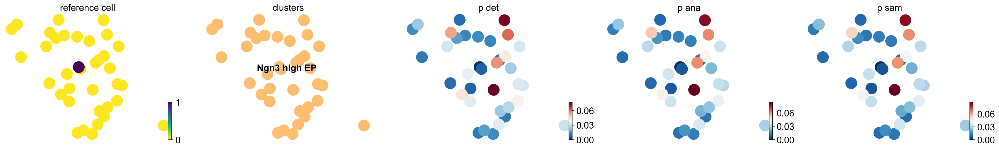

In [28]:
scv.pl.scatter(adata[ext(nbhs_ixs, reference_ix)], 
               color=[reference_ix_mask, 'clusters', ext(p_det, 0), ext(p_jax, 0), ext(p_mc, 0)], 
               title=['reference cell', 'clusters', 'p_det', 'p_ana', 'p_sam'
                      ], 
              legend_loc='on data')

Let's look at this at the level of individual transitions

In [29]:
n_cells = W.shape[0]
transition_probs_df = pd.DataFrame(data=[range(n_cells), p_det, p_jax, p_mc], 
                                   index=['neighbors', 'deterministic', 'stochastic - analytical', 'stochastic - sampling']).T
transition_probs_df = transition_probs_df.melt(id_vars='neighbors', var_name="mode", 
                                               value_name="transition probability")

Show the velocity based transition probabilities:

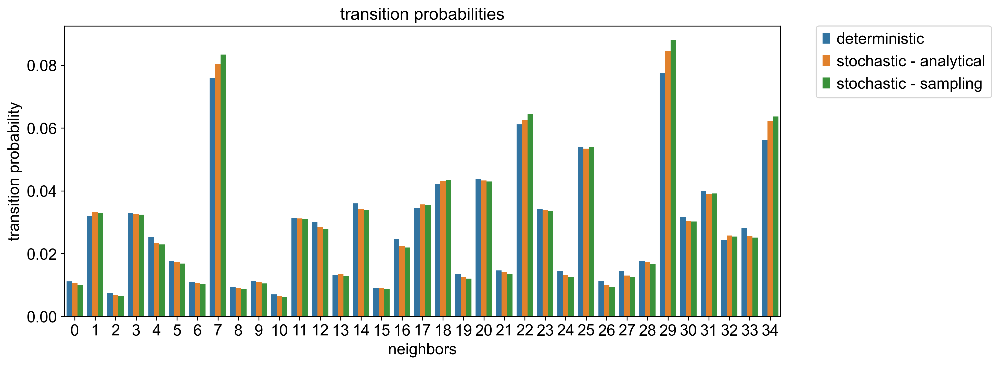

In [30]:
fig = plt.figure(None, figsize=(12, 5), dpi=150)
ax = fig.add_subplot(111)

ax = barplot(x='neighbors', y="transition probability", hue="mode", data=transition_probs_df, ax=ax)
ax.set_xticklabels(range(n_cells))

# Put the legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title(f"transition probabilities")
plt.show()

Sort and restrict to the top 10 cells

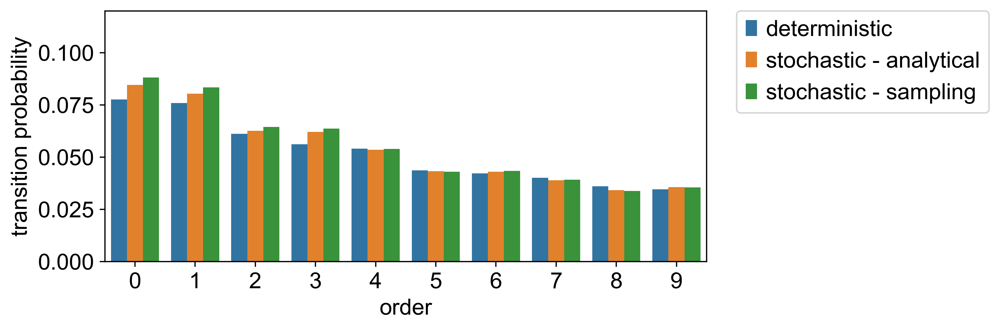

In [31]:
transition_probs_df = pd.DataFrame(data=[p_det, p_jax, p_mc], 
                                   index=['deterministic', 'stochastic - analytical', 'stochastic - sampling']).T
transition_probs_df = transition_probs_df.sort_values(by='deterministic', ascending=False).head(10)
transition_probs_df['order'] = range(transition_probs_df.shape[0])

transition_probs_df = transition_probs_df.melt(id_vars='order', var_name="mode", 
                                               value_name="transition probability")

fig = plt.figure(None, figsize=(7, 3), dpi=200)
ax = fig.add_subplot(111)

ax = barplot(x='order', y="transition probability", hue="mode", data=transition_probs_df, ax=ax)
ax.set_ylim(0, 0.12)
# ax.set_xticklabels(range(n_cells))

# Put the legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plt.title(f"transition probabilities")
plt.show()

Plotting this as a set of heatmaps

In [32]:
transition_probs_df = pd.DataFrame(data=[p_det, p_jax, p_mc], 
                                   index=['deterministic', 'stochastic - analytical', 'stochastic - sampling']).T

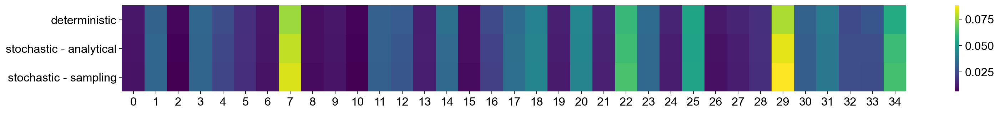

In [33]:
fig = plt.figure(None, (22, 2))
ax = fig.add_subplot(111)

heatmap(transition_probs_df.T, ax=ax, cmap="viridis")
plt.show()

Sort neighbors by their transition probability (deterministic mode)

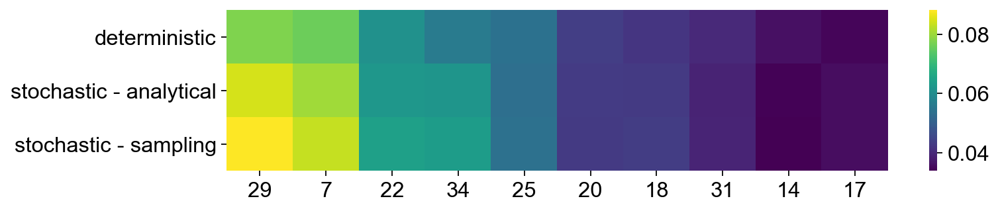

In [34]:
fig = plt.figure(None, (10, 2))
ax = fig.add_subplot(111)

heatmap(transition_probs_df.sort_values(by='deterministic', ascending=False).head(10).T, ax=ax, cmap="viridis")
plt.show()

# Aggregate to all cells - show absorption probs

In [35]:
from cellrank.tl.estimators import GPCCA

g_det = GPCCA(ker_det)
g_jax = GPCCA(ker_jax)

In [36]:
scv.settings.set_figure_params('scvelo', dpi_save=400, dpi=80, transparent=True, fontsize=20, color_map='viridis')

## Run the deterministic model

Computing Schur decomposition
When computing macrostates, choose a number of states NOT in `[6, 10]`
Adding `.eigendecomposition`
       `adata.uns['eig_fwd']`
       `.schur`
       `.schur_matrix`
    Finish (0:00:02)


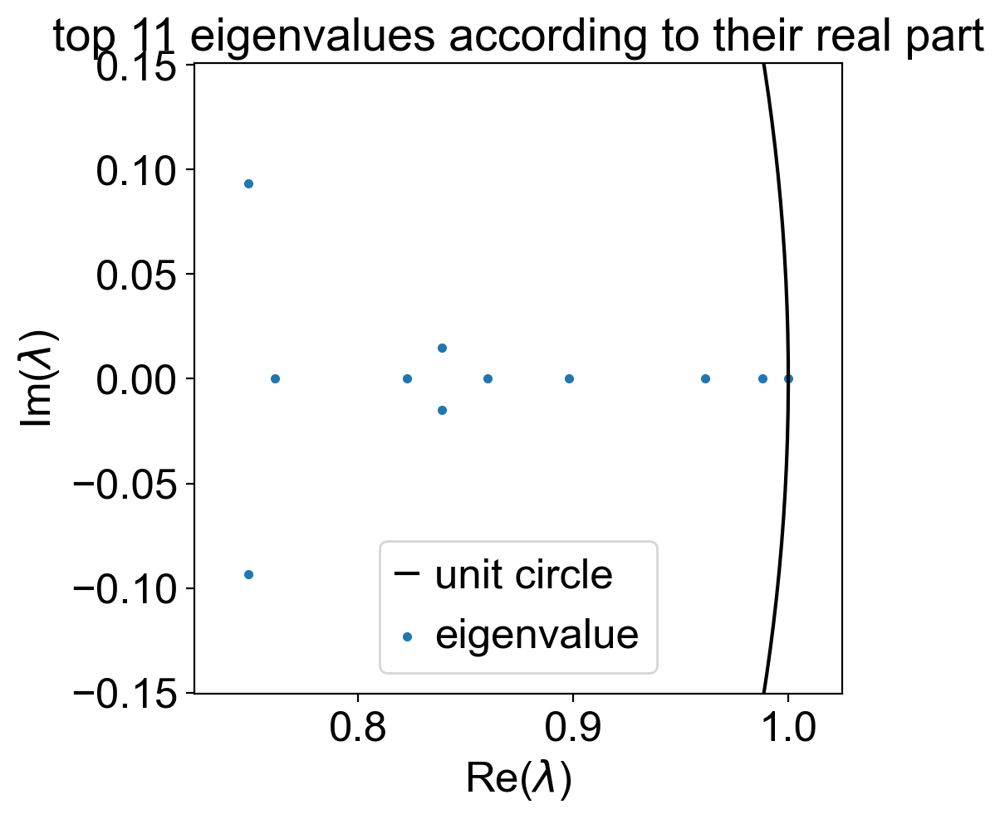

In [37]:
g_det.compute_schur()
g_det.plot_spectrum()

Computing `9` macrostates
INFO: Using pre-computed schur decomposition
Adding `.macrostates_memberships`
       `.macrostates`
       `.schur`
       `.coarse_T`
       `.coarse_stationary_distribution`
    Finish (0:00:01)


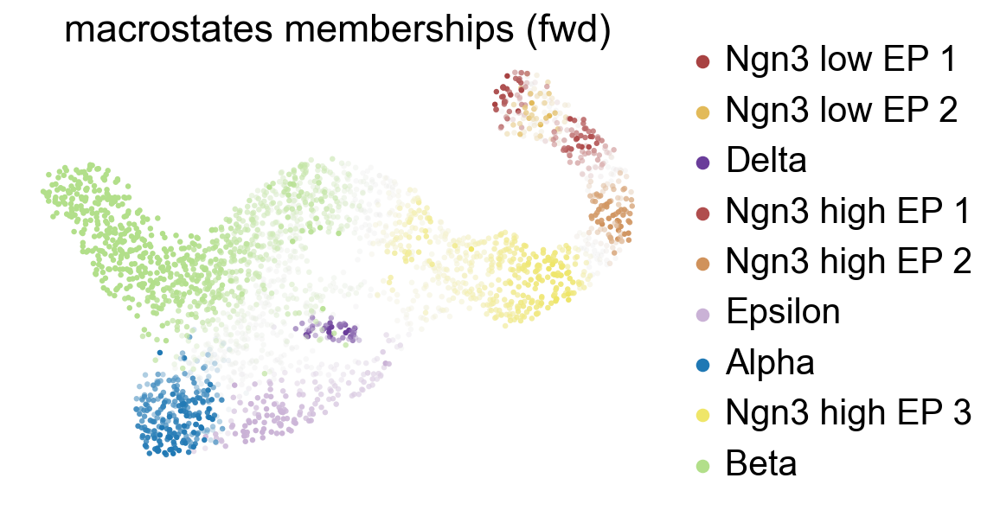

In [38]:
g_det.compute_macrostates(cluster_key='clusters', n_states=n_states)
g_det.plot_macrostates(legend_loc="right")

Automatically determine the terminal states:

Adding `adata.obs['terminal_states_probs']`
       `adata.obs['terminal_states']`
       `adata.obsm['macrostates_fwd']`
       `.terminal_states_probabilities`
       `.terminal_states`


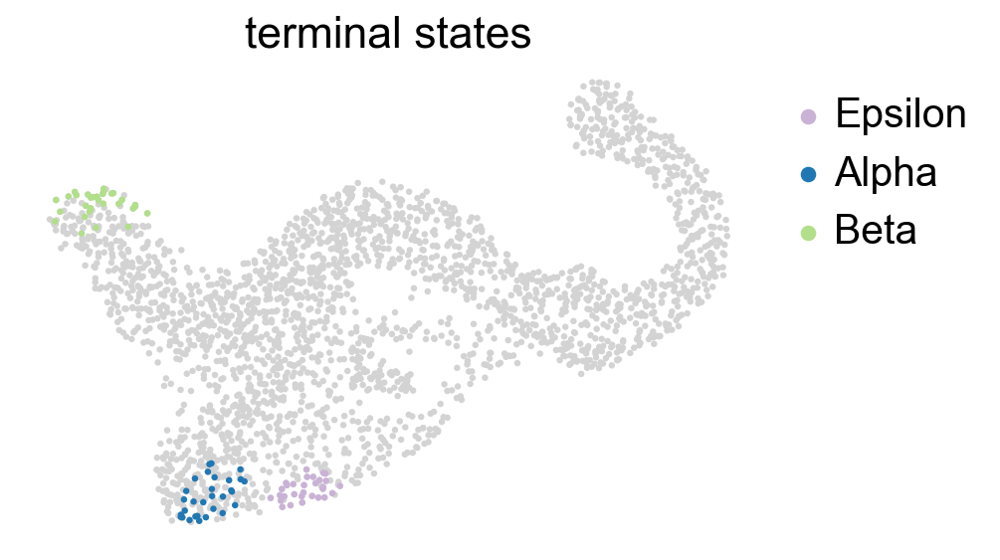

In [39]:
g_det.compute_terminal_states()
scv.pl.scatter(adata, c='terminal_states')

Add the Delta state manually:

In [40]:
g_det.set_terminal_states_from_macrostates(names=['Alpha', 'Beta', 'Epsilon', 'Delta'])

Adding `adata.obs['terminal_states_probs']`
       `adata.obs['terminal_states']`
       `adata.obsm['macrostates_fwd']`
       `.terminal_states_probabilities`
       `.terminal_states`


Computing absorption probabilities
Adding `adata.obsm['to_terminal_states']`
       `adata.obs['to_terminal_states_dp']`
       `.absorption_probabilities`
       `.diff_potential`
    Finish (0:00:00)


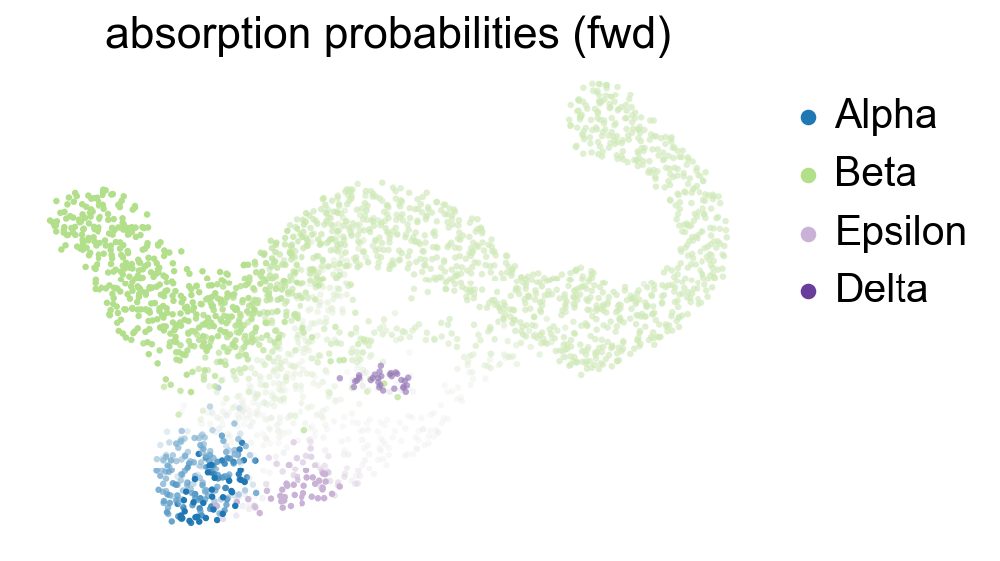

In [41]:
g_det.compute_absorption_probabilities()
g_det.plot_absorption_probabilities()

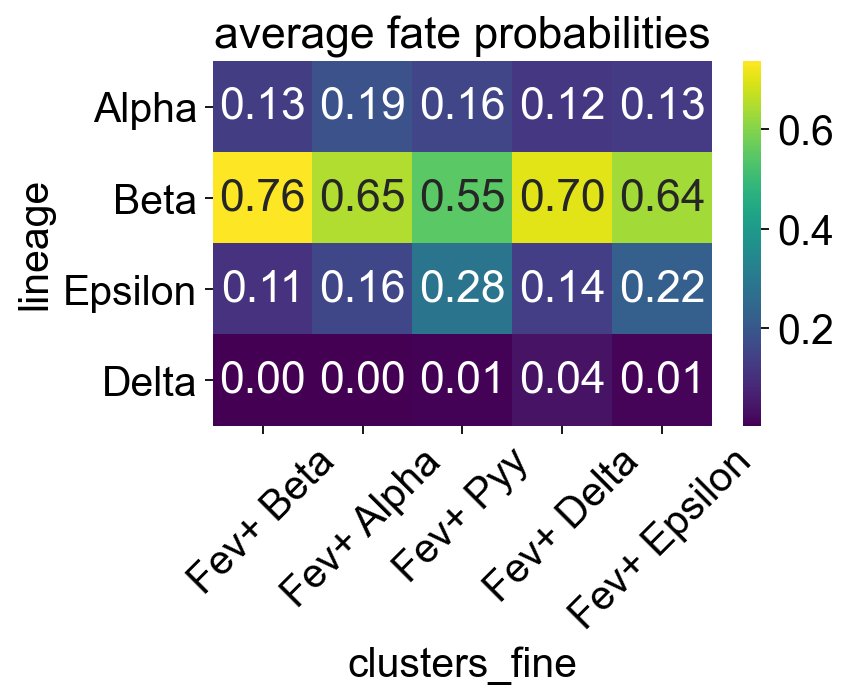

In [42]:
clusters = ['Fev+ Beta', 'Fev+ Alpha', 'Fev+ Pyy','Fev+ Delta', 'Fev+ Epsilon']

figure_kwargs = {'title': f'average fate probabilities', 
                 'lineages': ['Alpha', 'Beta', 'Epsilon', 'Delta'],
                 'cluster_key': 'clusters_fine',
                 'clusters': clusters,
                 'figsize': (5, 3)
                }
if save_figure: figure_kwargs['save'] = 'det_heatmap_fev+.pdf'

cr.pl.cluster_fates(adata, mode='heatmap', **figure_kwargs)

Plot heatmap for the Ngn3 high EP cells

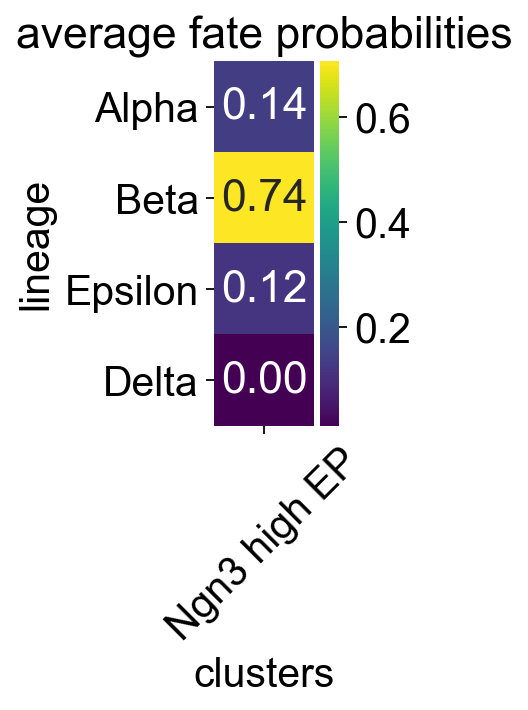

In [43]:
figure_kwargs = {'title': f'average fate probabilities', 
                 'lineages': ['Alpha', 'Beta', 'Epsilon', 'Delta'],
                 'cluster_key': 'clusters',
                 'clusters': "Ngn3 high EP",
                 'figsize': (1, 3)
                }
if save_figure: figure_kwargs['save'] = 'det_heatmap_ngn3.pdf'

cr.pl.cluster_fates(adata, mode='heatmap', **figure_kwargs)

## Run the stochastic (analytical) model

Computing Schur decomposition
When computing macrostates, choose a number of states NOT in `[6, 9]`
Adding `.eigendecomposition`
       `adata.uns['eig_fwd']`
       `.schur`
       `.schur_matrix`
    Finish (0:00:00)


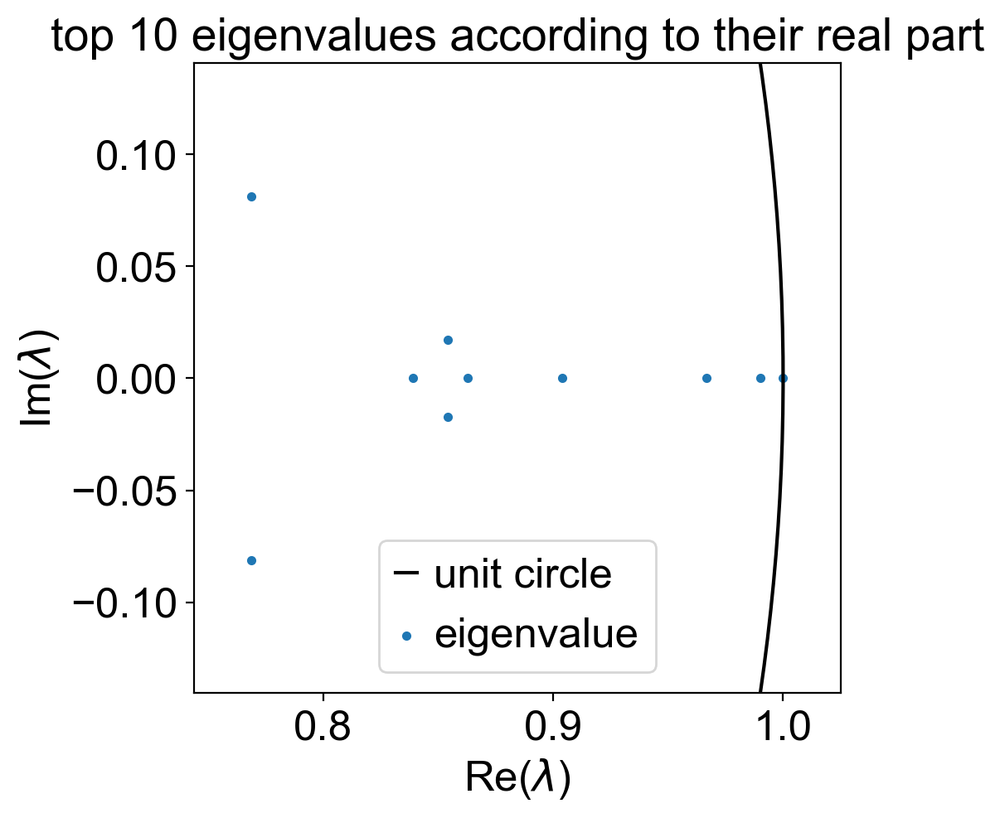

In [44]:
g_jax.compute_schur()
g_jax.plot_spectrum()

Computing `10` macrostates
INFO: Using pre-computed schur decomposition
Adding `.macrostates_memberships`
       `.macrostates`
       `.schur`
       `.coarse_T`
       `.coarse_stationary_distribution`
    Finish (0:00:03)


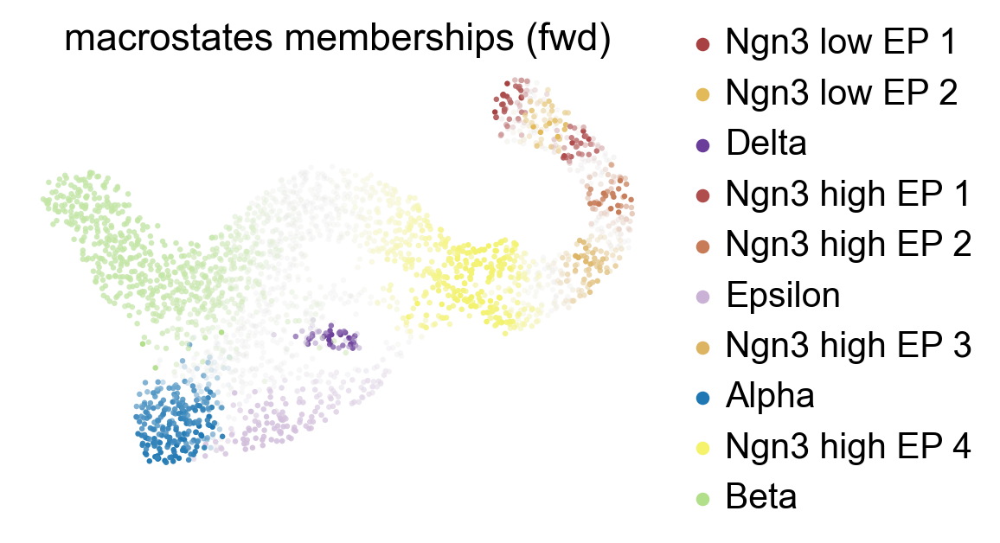

In [45]:
g_jax.compute_macrostates(cluster_key='clusters', n_states=n_states)
g_jax.plot_macrostates(legend_loc="right")

Automatically determine the terminal states:

Adding `adata.obs['terminal_states_probs']`
       `adata.obs['terminal_states']`
       `adata.obsm['macrostates_fwd']`
       `.terminal_states_probabilities`
       `.terminal_states`


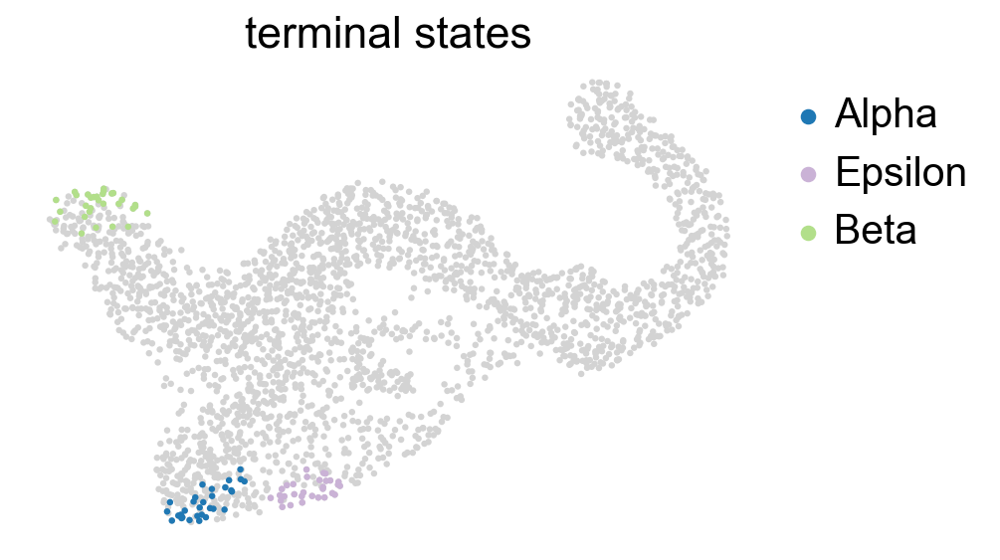

In [46]:
g_jax.compute_terminal_states()
scv.pl.scatter(adata, c='terminal_states')

Manually add the Delta state:

In [47]:
g_jax.set_terminal_states_from_macrostates(names=['Alpha', 'Beta', 'Epsilon', 'Delta'])

Adding `adata.obs['terminal_states_probs']`
       `adata.obs['terminal_states']`
       `adata.obsm['macrostates_fwd']`
       `.terminal_states_probabilities`
       `.terminal_states`


Computing absorption probabilities
Adding `adata.obsm['to_terminal_states']`
       `adata.obs['to_terminal_states_dp']`
       `.absorption_probabilities`
       `.diff_potential`
    Finish (0:00:00)


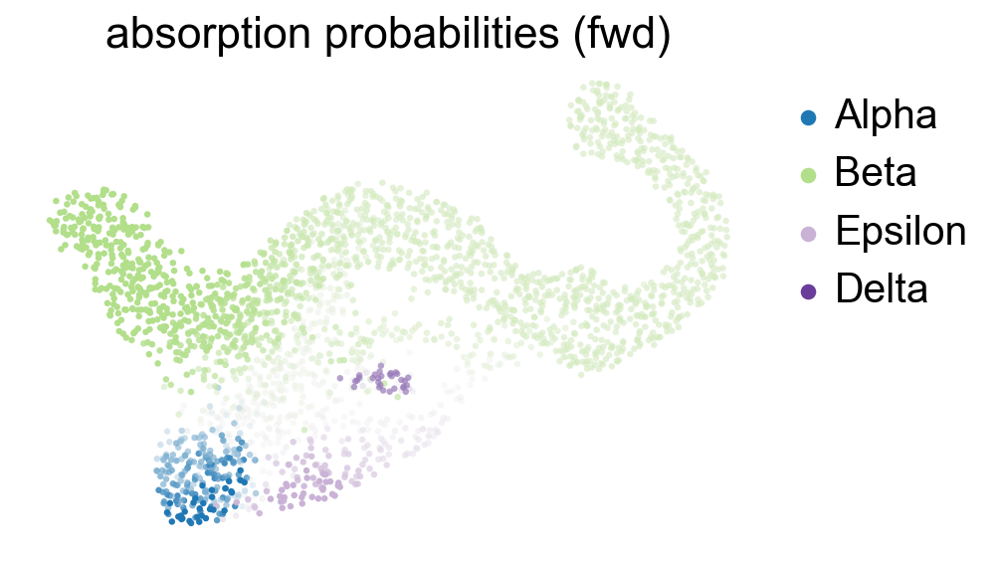

In [48]:
g_jax.compute_absorption_probabilities()
g_jax.plot_absorption_probabilities()

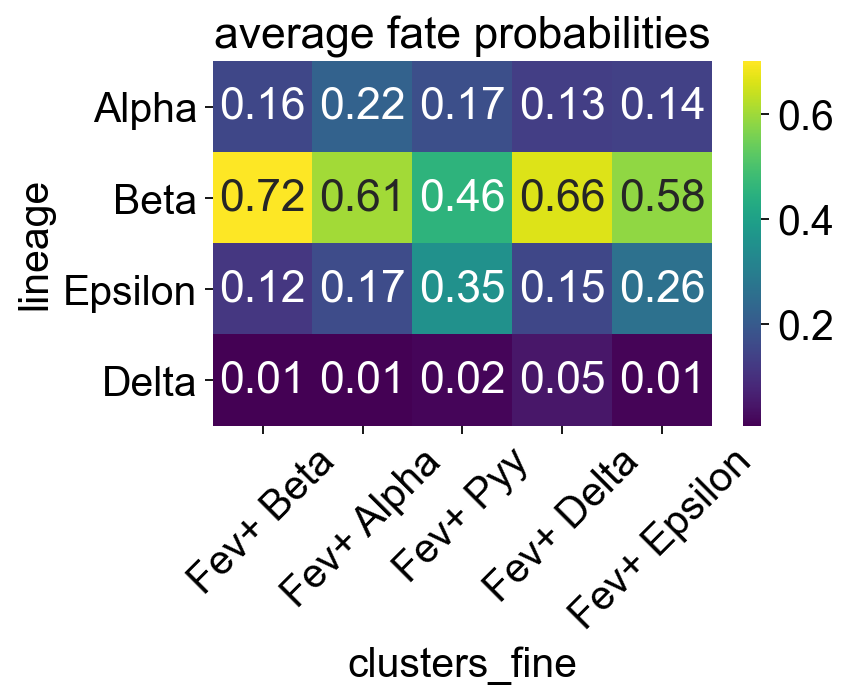

In [49]:
clusters = ['Fev+ Beta', 'Fev+ Alpha', 'Fev+ Pyy','Fev+ Delta', 'Fev+ Epsilon']

figure_kwargs = {'title': f'average fate probabilities', 
                 'lineages': ['Alpha', 'Beta', 'Epsilon', 'Delta'],
                 'cluster_key': 'clusters_fine',
                 'clusters': clusters,
                 'figsize': (5, 3)
                }
if save_figure: figure_kwargs['save'] = 'jax_heatmap_fev+.pdf'

cr.pl.cluster_fates(adata, mode='heatmap', **figure_kwargs)

Plot heatmap for the Ngn3 high EP cells

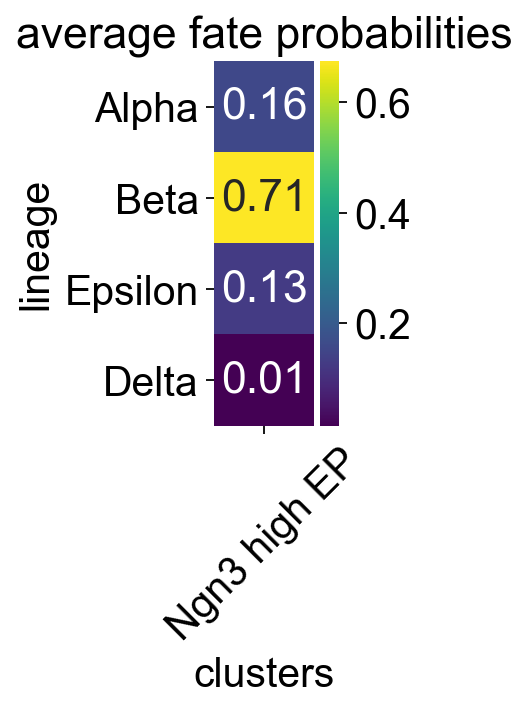

In [50]:
figure_kwargs = {'title': f'average fate probabilities', 
                 'lineages': ['Alpha', 'Beta', 'Epsilon', 'Delta'],
                 'cluster_key': 'clusters',
                 'clusters': "Ngn3 high EP",
                 'figsize': (1, 3)
                }
if save_figure: figure_kwargs['save'] = 'jax_heatmap_ngn3.pdf'

cr.pl.cluster_fates(adata, mode='heatmap', **figure_kwargs)

## Run the stochastic (sampling) model

This is in the notebook XXX. Note to self: figure out where this is. 